In [1]:
# Load libraries
import pandas
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
import random
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.preprocessing import StandardScaler
import shap
import xgboost as xgb
import re
from scipy import stats
import pickle
seed = 0
deterministic = True

random.seed(seed)
np.random.seed(seed)
with open('metadata/ACS_income_df.pickle', 'rb') as f:
    dataframe = pickle.load(f)
with open('metadata/ACS_income_label.pickle', 'rb') as f:
    labels = pickle.load(f)
D = 5
FEAT_NUM = dataframe.shape[1]
PERCENT = 75

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [2]:
dataframe.describe()

,"Employee of a private for-profit company orbusiness, or of an individual, for wages,salary, or commissions","Employee of a private not-for-profit, tax-exempt,or charitable organization",Federal government employee,"Local government employee (city, county, etc.)","Self-employed in own incorporated business,professional practice or farm","Self-employed in own not incorporated business,professional practice, or farm",State government employee,Working without pay in family business or farm,Divorced,Married,...,Male,Alaska Native alone,American Indian alone,"American Indian and Alaska Native tribes specified;or American Indian or Alaska Native,not specified and no other",Asian alone,Black or African American alone,Native Hawaiian and Other Pacific Islander alone,Some Other Race alone,Two or More Races,White alone
count,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,...,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000,195665.000000
mean,0.653234,0.070600,0.025840,0.080571,0.039241,0.085192,0.042419,0.002903,0.090941,0.523558,...,0.527999,0.000066,0.006613,0.002300,0.167168,0.043733,0.003256,0.116490,0.041939,0.618435
std,0.475942,0.256157,0.158658,0.272176,0.194167,0.279167,0.201545,0.053801,0.287526,0.499446,...,0.499217,0.008151,0.081053,0.047902,0.373127,0.204501,0.056965,0.320812,0.200450,0.485772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [3]:
### Slicing data ###
X = dataframe.values
y = labels.values
# Split train/test by 8:2. msk refers to the indices of the training data. Will be used for indexing Concepts
df = pandas.DataFrame(np.random.randn(dataframe.shape[0], 2))
msk = np.random.rand(len(df)) < 0.8
train_data = dataframe[msk]
test_data = dataframe[~msk]
X_train, y_train = X[msk], y[msk]
X_test, y_test = X[~msk], y[~msk]
X_train_og =  dataframe.iloc[msk]
y_train_og =  y[msk]

# Decision Tree performance

In [4]:
dt = DecisionTreeClassifier(criterion = "gini",
                               max_depth=5, min_samples_leaf=5)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
print(f"Decision Tree using Gini Index\nAccuracy is {accuracy_score(y_test,y_pred_dt)*100} f1 {f1_score(y_test,y_pred_dt)*100}","\n\nPrecision Value is\n", classification_report(y_test,y_pred_dt))
#print("Desicion Tree using Information Gain\nAccuracy is ", accuracy_score(y_test,y_pred_en)*100,"\n\nPrecision Value is\n",metrics.classification_report(y_test,y_pred_en))

Decision Tree using Gini Index
Accuracy is 77.47399476080267 f1 71.0621753193714 

Precision Value is
               precision    recall  f1-score   support

       False       0.78      0.85      0.82     23021
        True       0.76      0.67      0.71     16298

    accuracy                           0.77     39319
   macro avg       0.77      0.76      0.76     39319
weighted avg       0.77      0.77      0.77     39319



In [5]:
### Desicion Tree with Gini Index ###

dt_clf_gini = RandomForestClassifier(criterion = "gini",
                               max_depth=5, min_samples_leaf=5,n_estimators=10)
dt_clf_gini.fit(X_train, y_train)
y_pred_gini = dt_clf_gini.predict(X_test)
print(f"Decision Tree using Gini Index\nAccuracy is {accuracy_score(y_test,y_pred_gini)*100} f1 {f1_score(y_test,y_pred_gini)*100}","\n\nPrecision Value is\n", classification_report(y_test,y_pred_gini))

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Decision Tree using Gini Index
Accuracy is 76.4719346880643 f1 70.53540147147817 

Precision Value is
               precision    recall  f1-score   support

       False       0.78      0.83      0.80     23021
        True       0.73      0.68      0.71     16298

    accuracy                           0.76     39319
   macro avg       0.76      0.75      0.75     39319
weighted avg       0.76      0.76      0.76     39319



 #### Now Predicting data on both classifiers using the test values

In [6]:
y_pred_gini = dt_clf_gini.predict(X_test)
print(f"Decision Tree using Gini Index\nAccuracy is {accuracy_score(y_test,y_pred_gini)*100} f1 {f1_score(y_test,y_pred_gini)*100}","\n\nPrecision Value is\n", classification_report(y_test,y_pred_gini))

Decision Tree using Gini Index
Accuracy is 76.4719346880643 f1 70.53540147147817 

Precision Value is
               precision    recall  f1-score   support

       False       0.78      0.83      0.80     23021
        True       0.73      0.68      0.71     16298

    accuracy                           0.76     39319
   macro avg       0.76      0.75      0.75     39319
weighted avg       0.76      0.76      0.76     39319



#### --> Accuracy Scores And Precision value

In [7]:
dataframe.head()

,Age,Education,Work Hours per Week,"Employee of a private for-profit company orbusiness, or of an individual, for wages,salary, or commissions","Employee of a private not-for-profit, tax-exempt,or charitable organization",Federal government employee,"Local government employee (city, county, etc.)","Self-employed in own incorporated business,professional practice or farm","Self-employed in own not incorporated business,professional practice, or farm",State government employee,...,Male,Alaska Native alone,American Indian alone,"American Indian and Alaska Native tribes specified;or American Indian or Alaska Native,not specified and no other",Asian alone,Black or African American alone,Native Hawaiian and Other Pacific Islander alone,Some Other Race alone,Two or More Races,White alone
0,30,14.0,40.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,21,16.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,65,22.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,14.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,18,19.0,18.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


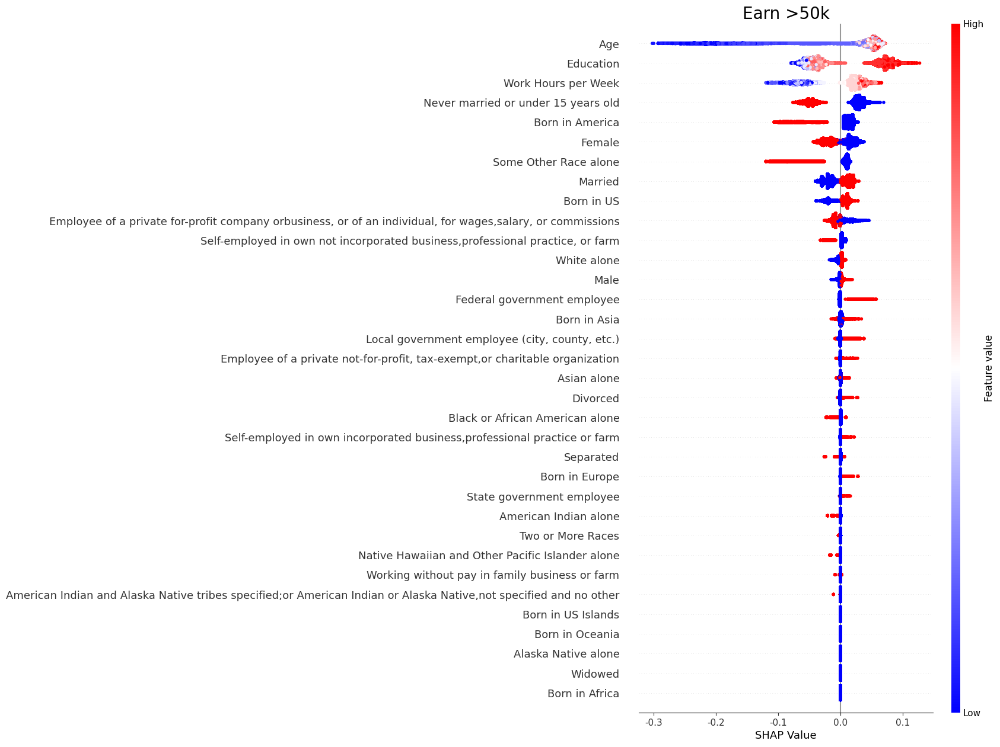

<Figure size 640x480 with 0 Axes>

In [8]:
rf_explainer = shap.TreeExplainer(dt_clf_gini)
rf_shap_values = rf_explainer.shap_values(X_train)
plt.rcParams['axes.unicode_minus'] = False
plt.tight_layout()
shap.summary_plot(rf_shap_values[1], X_train,
                  feature_names=dataframe.columns, 
                 cmap='bwr', show=False,
                  max_display=len(dataframe.columns),sort=True)
plt.xlabel('SHAP Value')
plt.title('Earn >50k', fontsize=20)
plt.show()
plt.savefig('shap/ACS_income_rf.png',bbox_inches='tight')

# Concept Extraction

In [9]:
# find path to the node by its node_numb
def find_path(node_numb, path, x):
        path.append(node_numb)
        if node_numb == x:
            return True
        left = False
        right = False
        if (children_left[node_numb] !=-1):
            left = find_path(children_left[node_numb], path, x)
        if (children_right[node_numb] !=-1):
            right = find_path(children_right[node_numb], path, x)
        if left or right :
            return True
        path.remove(node_numb)
        return False

# Given path information, get the rule
def get_rule(path, column_names):
    mask = ''
    for index, node in enumerate(path):
        #We check if we are not in the leaf
        if index!=len(path)-1:
            # Do we go under or over the threshold ?
            if (children_left[node] == path[index+1]):
                mask += "(dataframe['{}']<= {}) \t ".format(column_names[feature[node]], threshold[node])
            else:
                mask += "(dataframe['{}']> {}) \t ".format(column_names[feature[node]], threshold[node])
    # We insert the & at the right places
    mask = mask.replace("\t", "&", mask.count("\t") - 1)
    mask = mask.replace("\t", "")
    return mask

# compute node entropy
def gini(a):
    p1 = float(sum(a)/len(a))
    p2 = float((len(a)-sum(a))/len(a))
    return 1-p1**2-p2**2

# Compute the gini index, support of the rule, proprtion wrt to the support, depth of the tree
def compute_gini_size(rule):
    rule = rule.replace("dataframe","X_train_og")
    depth = rule.count('&') +1
    concept = 'c1 = '+rule
    exec(concept,globals())
    x = y_train_og[c1]
    print(x)
    return 1-gini(x), len(x), float(sum(x))/len(x)*100, depth 

# Concept Extraction

In [10]:
rules = set() #set of rules
entropy_dict = dict() # entropy dict for each depth

for i in range(1,9):
    entropy_dict[i] = list()
    
rule_entropy_dict = dict() # entropy for each rule
rule_depth = dict() # depth for each rule
rule_sample_num = dict() # sample number per rule
rule_pos_neg = dict()

for tree in dt_clf_gini.estimators_:
    n_nodes = tree.tree_.node_count
    children_left = tree.tree_.children_left
    children_right = tree.tree_.children_right
    feature = tree.tree_.feature
    threshold = tree.tree_.threshold
    
    # compute if leaf
    node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
    while len(stack) > 0:
        # `pop` ensures each node is only visited once
        node_id, depth = stack.pop()
        node_depth[node_id] = depth
        #n_node_samples[i]
        # If the left and right child of a node is not the same we have a split
        # node
        is_split_node = children_left[node_id] != children_right[node_id]
        # If a split node, append left and right children and depth to `stack`
        # so we can loop through them
        if is_split_node:
            stack.append((children_left[node_id], depth + 1))
            stack.append((children_right[node_id], depth + 1))
        else:
            is_leaves[node_id] = True
    l = list()
    for node in range(1,n_nodes):
        #change here for D
        if node_depth[node] <= D:
            l.append(node)
    paths ={}
    for node in np.unique(l):
        path = []
        find_path(0, path, node)
        paths[node] = np.unique(np.sort(path))
        rule = get_rule(paths[node], dataframe.columns)
        rules.add(rule)
        impurity,sample_size,percent,depth = compute_gini_size(rule)
        rule_entropy_dict[rule] = impurity
        rule_depth[rule] = depth
        rule_sample_num[rule] = sample_size
        rule_pos_neg[rule] = percent
rules = sorted(rules)


[[False]
 [False]
 [False]
 ...
 [ True]
 [False]
 [False]]
[[False]
 [ True]
 [False]
 ...
 [ True]
 [False]
 [False]]
[[ True]
 [False]
 [ True]
 ...
 [ True]
 [ True]
 [False]]
[[ True]
 [ True]
 [False]
 ...
 [ True]
 [ True]
 [False]]
[[ True]
 [ True]
 [False]
 ...
 [ True]
 [ True]
 [False]]
[[False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [ True]
 [ True]
 [False]
 [False]
 [ True]
 [False]
 [False]
 [ True]
 [False]
 [ True]
 [ True]
 [False]
 [False]
 [False]
 [False]
 [False]
 [ True]
 [ True]
 [False]
 [ True]
 [ True]
 [ True]
 [False]
 [False]
 [ True]
 [False]
 [False]
 [ True]
 [ True]
 [ True]
 [ True]
 [False]
 [ True]
 [ True]
 [False]
 [False]
 [ True]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [ True]
 [False]
 [ True]
 [ True]
 [False]
 [False]
 [False]
 [False]
 [False]
 [ True]
 [False]
 [False]
 [False]
 [False]
 [ True

In [11]:
# Sort the rules by impurity
rule_entropy_dict = {k: v for k, v in sorted(rule_entropy_dict.items(), key=lambda item: item[1],reverse=True)}
#Compute the percentage of the rules
TOPK = int(len(rules) * PERCENT*0.01)
score_dict = dict()
for rule in rules:
    score_dict[rule] = rule_entropy_dict[rule]*rule_sample_num[rule]
# Extract top k% of the rules by score
rules = list(score_dict.keys())[:TOPK]
print(f'Number of rules extracted {len(rules)}')

Number of rules extracted 447


## Convert Rules to Explanations

In [12]:
explanations = [] # List of simplified rules
ordinal = ['Age','Education','Work Hours per Week']
for i in range(len(rules)):
    rule = rules[i]
    posneg = rule_pos_neg[rule]
    score = score_dict[rule]
    features = re.findall("'([^']*)'", rule)
    thresholds = re.findall("\d+\.\d+", rule)
    rule = rule.replace("dataframe","X_train_og")
    command = 'c1 = '+rule
    exec(command)
    group = X_train_og[c1]
    total_percentage = (len(group)/len(dataframe)*100)
    explanation = f'Population: {total_percentage:.1f}% positive:{posneg:.1f}% score: {score/max(score_dict.values()):.1f}'
    r = rule.split('&')
    for j,f in enumerate(r):
        command = f'c1 = {f}'
        exec(command)
        group = X_train_og[c1]
        if features[j] in ordinal:
            #Given a threshold, compute the percentile of the feature value belongs to.
            # Ex) education > 12: 10 means that 10% of the data points have education > 12
            # Ex2) education <=12: 90 means that 90% of the data points have education <=12 
            percentile = stats.percentileofscore(X_train_og[features[j]], float(thresholds[j]),'weak')
            if '>' in f:
                percentile = 100-percentile
                explanation += f' ({features[j]}>{float(thresholds[j]):.1f}: P_{percentile:.1f})'
            else:
                explanation += f' ({features[j]}<={float(thresholds[j]):.1f}: P_{percentile:.1f})'
            
        else:
            percentage = len(group)/len(dataframe)*100
            if '>' in f:
                explanation += f' ({features[j]} True: {percentage:.1f}%)'
            else:
                explanation += f' ({features[j]} False: {percentage:.1f}%)'
    explanations.append(explanation)

In [13]:
# For each row, create a new input for the Concept Network.
## if the row belongs to a concept, it is labelled 1 and 0 otherwise.
cur_len = len(rules)
concepts = list()
for rule in rules:
    concept = 'c1 = '+rule
    exec(concept)
    c1 = c1.astype(float)
    c1 = list(c1)
    concepts.append(c1)        
l = list()
for i in range(len(concepts[0])):
    tmp = list()
    for c in concepts:
        tmp.append(c[i])
    l.append(tmp)
l = [tuple(i) for i in l]
l_train_og = [l[i] for i,v in enumerate(msk) if v]

# Base XGBoost

In [14]:
params = {'max_depth' : 50,
        'subsample': 0.6,
        'colsmaple_bytree': 0.7,
        'min_child_weight': 6,
        'gamma': 8,
        'reg_lambda': 1.25,
}
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test= sc.fit_transform(X_test)
base_model=xgb.XGBClassifier()
base_model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [15]:
preds = base_model.predict(X_test)
print(f'acc: {accuracy_score(preds,y_test)} f1: {f1_score(preds,y_test)}')

acc: 0.7964597268496146 f1: 0.7543811189884295


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


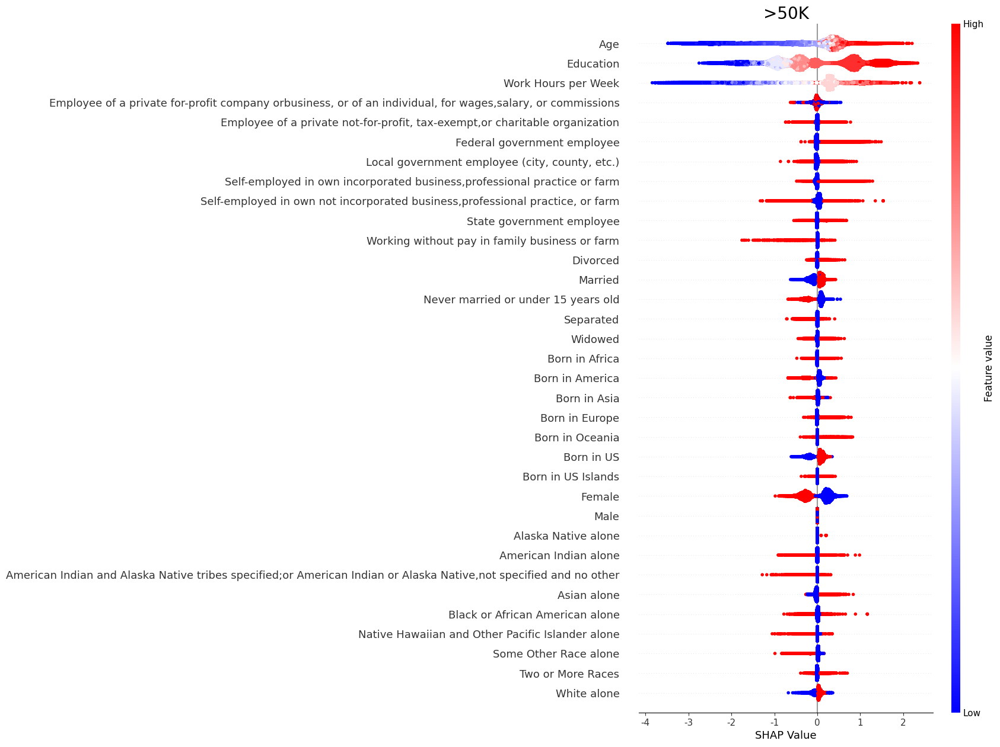

<Figure size 640x480 with 0 Axes>

In [16]:
base_explainer = shap.Explainer(base_model)
base_shap_values = base_explainer.shap_values(X_train)
plt.rcParams['axes.unicode_minus'] = False
plt.tight_layout()
shap.summary_plot(base_shap_values, X_train,
                  feature_names=dataframe.columns, 
                 cmap='bwr', show=False,
                  max_display=len(dataframe.columns),sort=False)
plt.xlabel('SHAP Value')
plt.title('>50K', fontsize=20)
plt.show()
plt.savefig('shap/ACS_income_base.png',dpi=300,bbox_inches='tight')

In [17]:
for c in dataframe.columns:
    print(dataframe[c].head())


0    30
1    21
2    65
3    33
4    18
Name: Age, dtype: object
0    14.0
1    16.0
2    22.0
3    14.0
4    19.0
Name: Education, dtype: object
0    40.0
1    20.0
2     8.0
3    40.0
4    18.0
Name: Work Hours per Week, dtype: object
0    0.0
1    0.0
2    0.0
3    1.0
4    0.0
Name: Employee of a private for-profit company orbusiness, or of an individual, for wages,salary, or commissions, dtype: float64
0    0.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: Employee of a private not-for-profit, tax-exempt,or charitable organization, dtype: float64
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Federal government employee, dtype: float64
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Local government employee (city, county, etc.), dtype: float64
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Self-employed in own incorporated business,professional practice or farm, dtype: float64
0    1.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Self-employed in own not incorporated business

# C>Y


In [18]:
C_train, y_train =  [l[i] for i,v in enumerate(msk) if v], y[msk]
C_test, y_test = [l[i] for i,v in enumerate(msk) if not v], y[~msk]

sc = StandardScaler()
C_train = sc.fit_transform(C_train)
C_test= sc.fit_transform(C_test)
concept_model=xgb.XGBClassifier()
concept_model.fit(C_train,y_train)

preds = concept_model.predict(C_train)
print(f'acc: {accuracy_score(preds,y_train)} f1: {f1_score(preds,y_train)}')


acc: 0.7900234096171312 f1: 0.7377728786753253


In [19]:
preds = concept_model.predict(C_test)
print(f'acc: {accuracy_score(preds,y_test)} f1: {f1_score(preds,y_test)}')
print(f'prec {precision_score(preds,y_test)} recall {recall_score(preds,y_test)}')

acc: 0.7854218062514307 f1: 0.7352931948671289
prec 0.7189839244079028 recall 0.7523595505617977


In [21]:

c_explainer = shap.TreeExplainer(concept_model, C_train)
c_shap_values = c_explainer.shap_values(C_train)

100%|===================| 156339/156346 [04:21<00:00]        

In [22]:
plt.tight_layout()
plt.rcParams['axes.unicode_minus'] = False
shap.summary_plot(c_shap_values, C_train,
                  feature_names=explanations, 
                 cmap='bwr', show=False,max_display=len(rules),sort=False)
plt.xlabel('SHAP Value')
plt.title('Earn >50k', fontsize=20)
plt.show()
plt.savefig('shap/ACS_income_concept.png',dpi=300,bbox_inches='tight')

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


<Figure size 640x480 with 0 Axes>

In [23]:
X_train = X[msk]

In [24]:
pred_base = list(base_model.predict(X_train))
pred_c = list(concept_model.predict(C_train))
agreed = [pred_base[i] == pred_c[i] for i in range(len(pred_base))]
print(f'train {sum(agreed)/len(agreed)*100:.2f} agreed')

train 50.88 agreed


In [25]:
cur_depth = 1
for rule in sorted(rules):
    out = f'{rule}\n entropy: {1-rule_entropy_dict[rule]:.3f}, 50k Ratio: {rule_pos_neg[rule]:.2f}%, sample size: {rule_sample_num[rule]}\n'
    depth = rule_depth[rule]
    if depth != cur_depth:
        if depth <cur_depth:
            print('*************NEW TREE*****************')
        cur_depth = depth
        out+='\n'
    print(out)

(dataframe['Age']<= 27.5)  
 entropy: 0.183, 50k Ratio: 10.21%, sample size: 30140

(dataframe['Age']<= 27.5) & (dataframe['Age']<= 24.5)  
 entropy: 0.085, 50k Ratio: 4.47%, sample size: 20101


(dataframe['Age']<= 27.5) & (dataframe['Age']<= 24.5) & (dataframe['Born in America']<= 0.5)  
 entropy: 0.088, 50k Ratio: 4.64%, sample size: 18747


(dataframe['Age']<= 27.5) & (dataframe['Age']<= 24.5) & (dataframe['Born in America']<= 0.5) & (dataframe['Asian alone']<= 0.5)  
 entropy: 0.078, 50k Ratio: 4.04%, sample size: 16149


(dataframe['Age']<= 27.5) & (dataframe['Age']<= 24.5) & (dataframe['Born in America']<= 0.5) & (dataframe['Asian alone']<= 0.5) & (dataframe['Separated']<= 0.5)  
 entropy: 0.077, 50k Ratio: 4.03%, sample size: 16119


(dataframe['Age']<= 27.5) & (dataframe['Age']<= 24.5) & (dataframe['Born in America']<= 0.5) & (dataframe['Asian alone']<= 0.5) & (dataframe['Separated']> 0.5)  
 entropy: 0.231, 50k Ratio: 13.33%, sample size: 30

*************NEW TREE************

In [26]:
for rule in {k: v for k, v in sorted(score_dict.items(), key=lambda item: item[1],reverse=True)}:
    out = f'{rule}\n entropy: {1-rule_entropy_dict[rule]:.3f}, 50k Ratio: {rule_pos_neg[rule]:.2f}%, sample size: {rule_sample_num[rule]}\n'
    depth = rule_depth[rule]
    if depth != cur_depth:
        if depth <cur_depth:
            print('*************NEW TREE*****************')
        cur_depth = depth
        out+='\n'
    print(out)

*************NEW TREE*****************
(dataframe['Some Other Race alone']<= 0.5)  
 entropy: 0.492, 50k Ratio: 43.82%, sample size: 138111


(dataframe['Age']> 27.5)  
 entropy: 0.499, 50k Ratio: 48.30%, sample size: 126206

(dataframe['Age']> 27.5) & (dataframe['Federal government employee']<= 0.5)  
 entropy: 0.499, 50k Ratio: 47.76%, sample size: 123294


*************NEW TREE*****************
(dataframe['Age']> 28.5)  
 entropy: 0.500, 50k Ratio: 48.81%, sample size: 122662


(dataframe['Education']<= 20.5)  
 entropy: 0.379, 50k Ratio: 25.43%, sample size: 95968

(dataframe['Age']> 27.5) & (dataframe['Some Other Race alone']<= 0.5)  
 entropy: 0.500, 50k Ratio: 51.24%, sample size: 112529


(dataframe['Some Other Race alone']<= 0.5) & (dataframe['Age']> 27.5)  
 entropy: 0.500, 50k Ratio: 51.24%, sample size: 112529

(dataframe['Age']> 27.5) & (dataframe['Federal government employee']<= 0.5) & (dataframe['Some Other Race alone']<= 0.5)  
 entropy: 0.500, 50k Ratio: 50.73%, sample

In [27]:
for rule in {k: v for k, v in sorted(rule_pos_neg.items(), key=lambda item: item[1],reverse=True)}:
    out = f'{rule}, D:{rule_depth[rule]}\n entropy: {rule_entropy_dict[rule]:.3f}, pos:neg {rule_pos_neg[rule]:.2f}, sample size: {rule_sample_num[rule]}\n'
    depth = rule_depth[rule]
    if depth != cur_depth:
        if depth <cur_depth:
            print('*************NEW TREE*****************')
        cur_depth = depth
        out+='\n'
    print(out)

(dataframe['Age']> 27.5) & (dataframe['Federal government employee']> 0.5) & (dataframe['Separated']> 0.5) & (dataframe['Education']> 21.5)  , D:4
 entropy: 1.000, pos:neg 100.00, sample size: 10

(dataframe['Education']> 20.5) & (dataframe['Age']> 27.5) & (dataframe['Female']<= 0.5) & (dataframe['Never married or under 15 years old']<= 0.5) & (dataframe['Self-employed in own not incorporated business,professional practice, or farm']<= 0.5)  , D:5
 entropy: 0.722, pos:neg 83.32, sample size: 19471


*************NEW TREE*****************
(dataframe['Education']> 20.5) & (dataframe['Age']> 27.5) & (dataframe['Female']<= 0.5) & (dataframe['Never married or under 15 years old']<= 0.5)  , D:4
 entropy: 0.696, pos:neg 81.34, sample size: 21557


(dataframe['Age']> 28.5) & (dataframe['Work Hours per Week']> 35.5) & (dataframe['Born in America']<= 0.5) & (dataframe['Education']> 20.5) & (dataframe['Asian alone']<= 0.5)  , D:5
 entropy: 0.691, pos:neg 80.89, sample size: 28294


(dataframe['Fe